# Correlation analysis

This notebook creates the correlation matrix using the MR counts and a SPELL processed version.

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
import os
import pandas as pd
import plotnine as pn
import seaborn as sns
from sklearn import preprocessing
import matplotlib.pyplot as plt
import umap
import random
import numpy as np
import scipy
from scipy.spatial.distance import pdist, squareform
from sklearn.decomposition import PCA
from scripts import paths, utils

/home/alexandra/anaconda3/envs/core_acc/lib/python3.7/site-packages/matplotlib/__init__.py:886: MatplotlibDeprecationWarning: 
examples.directory is deprecated; in the future, examples will be found relative to the 'datapath' directory.
  "found relative to the 'datapath' directory.".format(key))


## Set user parameters

Here we set the number of PCs or singular vectors to use. We are starting with 300 since this is what [eADAGE](https://pubmed.ncbi.nlm.nih.gov/28711280/) used.

In [2]:
# Params

# Which subset of genes to consider: core, acc, all
subset_genes = "all"

# The number of accessory genes is 200 - 500
# The number of core genes is ~ 5000
# So the number of singular vectors is relative to the number of genes
# These numbers for selected based on a manual inspection of the heatmaps
# Making sure the dominant signal is removed and the approximate size of the clusters
# seems reasonable
if subset_genes == "acc":
    num_SVs = 50
else:
    num_SVs = 100

In [3]:
# Load expression data
pao1_compendium_filename = paths.PAO1_COMPENDIUM
pa14_compendium_filename = paths.PA14_COMPENDIUM

In [4]:
pao1_compendium = pd.read_csv(pao1_compendium_filename, sep="\t", header=0, index_col=0)
pa14_compendium = pd.read_csv(pa14_compendium_filename, sep="\t", header=0, index_col=0)

In [5]:
print(pao1_compendium.shape)
pao1_compendium.head()

(1081, 5563)


,PA0001,PA0002,PA0003,PA0004,PA0005,PA0006,PA0007,PA0008,PA0009,PA0010,...,PA1905,PA0195,PA4812,PA0195.1,PA0457.1,PA1552.1,PA1555.1,PA3701,PA4724.1,PA5471.1
ERX541572,5793.218939,766.512255,1608.330977,1663.466070,176.163343,384.600886,295.846835,453.183561,611.865046,43.032267,...,1.344758,75.306467,447.804528,10.758067,65.893159,44.377025,56.479850,2033.274614,184.231893,1.344758
ERX541573,4416.506898,797.782811,1770.117221,1562.763979,313.958581,324.501966,333.873864,415.877970,550.599003,38.659079,...,1.171487,103.090877,698.206395,18.743796,138.235494,39.830566,96.061954,1315.580171,91.376005,1.171487
ERX541574,3825.086116,644.433113,1852.251003,1589.338107,260.936107,270.820051,363.729119,363.729119,423.032780,67.210815,...,1.976789,128.491265,468.498920,19.767887,73.141182,33.605408,55.350083,1759.341934,67.210815,3.953577
ERX541575,3834.097653,789.216207,1926.825153,1610.427665,289.734779,261.294555,250.629471,520.811596,666.567742,53.325419,...,1.777514,124.425979,611.464809,15.997626,177.751398,21.330168,108.428353,1486.001686,56.880447,1.777514
ERX541576,3515.165133,853.775186,2185.277130,1683.341246,183.989360,245.319146,253.388855,380.890253,551.968079,66.171612,...,1.613942,90.380738,745.641089,11.297592,130.729282,50.032194,95.222563,1273.400041,72.627379,1.613942


In [6]:
print(pa14_compendium.shape)
pa14_compendium.head()

(576, 5887)


,PA14_55610,PA14_55600,PA14_55590,PA14_55580,PA14_55570,PA14_55560,PA14_55550,PA14_55540,PA14_55530,PA14_55520,...,PA14_19205,PA14_17675,PA14_67975,PA14_36345,PA14_43405,PA14_38825,PA14_24245,PA14_28895,PA14_55117,PA14_59845
ERX1477379,222.428844,13.264105,3.060947,236.713266,62.239264,21.426632,18.365684,49.995474,22.446948,3.060947,...,30.609474,156.108317,996.848537,236.713266,3.060947,11.223474,400.984109,262.221161,154.067686,162.230212
ERX1477380,201.567650,20.872390,3.578124,294.598874,93.627577,29.221346,17.294266,85.874975,36.973948,4.770832,...,33.395824,127.619755,731.129998,149.684853,1.192708,4.770832,199.778588,353.041565,63.809878,261.799404
ERX1477381,176.601967,34.431830,14.994507,358.202102,127.175630,37.208590,19.992675,111.625771,38.319295,2.776760,...,52.758449,124.954222,750.280682,129.952391,1.666056,2.776760,183.821544,380.416186,49.426337,92.188448
ERX2174773,52.298674,25.694566,8.185879,7.276337,21.374241,11.369277,5.229867,10.004964,52.753445,6.594181,...,78.220626,43.430638,1032.785125,490.925382,0.227386,40.474626,125.289433,519.575960,68.215662,129.382373
ERX2174774,61.883169,20.211842,8.483983,5.988694,17.966081,11.228801,3.243876,15.221263,55.395418,4.241991,...,81.845482,32.438758,939.476338,486.082313,0.249529,45.663790,130.753148,674.975696,64.128929,146.722998


## Get core/accessory genes

We will subset the correlation matrix to only consider core genes.

_Rationale:_ Previously we used all genes (both core and accessory) to create a co-expression network, but due to the large imbalance in the number of core genes compared to accessory genes, no module was found to be "mostly core." Instead we will perform separate analyses of core and accessory genes to examine co-expression patterns.

In [7]:
# Read in expression data
pao1_expression_filename = paths.PAO1_COMPENDIUM
pa14_expression_filename = paths.PA14_COMPENDIUM

pao1_expression = pd.read_csv(pao1_expression_filename, sep="\t", index_col=0, header=0)
pa14_expression = pd.read_csv(pa14_expression_filename, sep="\t", index_col=0, header=0)

In [8]:
pao1_annot_filename = paths.GENE_PAO1_ANNOT
pa14_annot_filename = paths.GENE_PA14_ANNOT

core_acc_dict = utils.get_my_core_acc_genes(
    pao1_annot_filename, pa14_annot_filename, pao1_expression, pa14_expression
)

Number of PAO1 core genes: 5366
Number of PA14 core genes: 5363
Number of PAO1 core genes in my dataset: 5361
Number of PA14 core genes in my dataset: 5357
Number of PAO1-specific genes: 202
Number of PA14-specific genes: 530


In [9]:
pao1_core = core_acc_dict["core_pao1"]
pa14_core = core_acc_dict["core_pa14"]
pao1_acc = core_acc_dict["acc_pao1"]
pa14_acc = core_acc_dict["acc_pa14"]

## Select gene subset

In [10]:
# Select subset of genes
if subset_genes == "core":
    pao1_compendium = pao1_compendium[pao1_core]
    pa14_compendium = pa14_compendium[pa14_core]
elif subset_genes == "acc":
    pao1_compendium = pao1_compendium[pao1_acc]
    pa14_compendium = pa14_compendium[pa14_acc]

In [11]:
print(pao1_compendium.shape)
print(pa14_compendium.shape)

(1081, 5563)
(576, 5887)


## Correlation of raw gene expression data

Here is the correlation of the raw data without any manipulations. This will serve as a reference to compare the correlations below where applied corrections to the correlations to account for the dominant signal described above.

In [12]:
# Correlation
pao1_corr_original = pao1_compendium.corr()
pa14_corr_original = pa14_compendium.corr()

In [13]:
# Check for duplicates indices
assert pao1_corr_original.index.duplicated().sum() == 0
assert pa14_corr_original.index.duplicated().sum() == 0

In [14]:
# Check for duplicate rows
assert pao1_corr_original[pao1_corr_original.duplicated(keep=False)].shape[0] == 0
assert pa14_corr_original[pa14_corr_original.duplicated(keep=False)].shape[0] == 0

In [15]:
print(pao1_corr_original.shape)
pao1_corr_original.head()

(5563, 5563)


,PA0001,PA0002,PA0003,PA0004,PA0005,PA0006,PA0007,PA0008,PA0009,PA0010,...,PA1905,PA0195,PA4812,PA0195.1,PA0457.1,PA1552.1,PA1555.1,PA3701,PA4724.1,PA5471.1
PA0001,1.000000,0.504374,0.718591,0.422974,0.438670,0.199643,-0.141402,0.440828,0.756820,0.074463,...,-0.115933,0.049183,0.079396,0.191588,0.076527,0.253371,0.104529,0.655377,0.093839,-0.005854
PA0002,0.504374,1.000000,0.394447,0.878571,0.489011,0.154055,-0.068934,0.513275,0.515685,0.269166,...,-0.027967,-0.020369,0.226450,0.400621,0.056498,0.530016,0.239044,0.562069,0.184411,0.051842
PA0003,0.718591,0.394447,1.000000,0.450358,0.373708,0.344061,-0.149325,0.355086,0.670839,0.160680,...,-0.100925,-0.049963,0.163508,0.047849,0.058767,0.300147,0.163133,0.575482,0.071525,-0.019298
PA0004,0.422974,0.878571,0.450358,1.000000,0.467892,0.172487,-0.116721,0.562558,0.477646,0.234211,...,-0.090967,-0.126167,0.248069,0.227863,0.103378,0.566529,0.317867,0.519271,0.092090,-0.031536
PA0005,0.438670,0.489011,0.373708,0.467892,1.000000,0.451336,-0.194598,0.536219,0.496760,0.124712,...,-0.160771,-0.153860,0.113426,0.126779,0.004854,0.397497,-0.008412,0.584733,0.269313,0.097987


In [16]:
print(pa14_corr_original.shape)
pa14_corr_original.head()

(5887, 5887)


,PA14_55610,PA14_55600,PA14_55590,PA14_55580,PA14_55570,PA14_55560,PA14_55550,PA14_55540,PA14_55530,PA14_55520,...,PA14_19205,PA14_17675,PA14_67975,PA14_36345,PA14_43405,PA14_38825,PA14_24245,PA14_28895,PA14_55117,PA14_59845
PA14_55610,1.000000,0.729303,0.700841,0.033202,0.002027,-0.007572,0.067042,-0.025928,0.244718,0.114425,...,-0.039839,0.005714,-0.026527,-0.071262,-0.006655,-0.094194,-0.035350,-0.110997,0.585639,-0.035984
PA14_55600,0.729303,1.000000,0.879056,0.036963,0.002839,-0.003675,0.069678,-0.030883,0.179008,0.172807,...,0.119014,-0.058826,-0.110239,-0.110269,-0.020201,-0.130729,-0.194383,0.023146,0.132394,-0.153415
PA14_55590,0.700841,0.879056,1.000000,0.039021,-0.001147,-0.017802,0.015207,0.000623,0.174934,0.110043,...,0.085094,-0.030675,-0.077411,-0.091533,-0.012505,-0.108191,-0.136796,-0.059736,0.215600,-0.097818
PA14_55580,0.033202,0.036963,0.039021,1.000000,0.410720,0.049562,0.103709,0.037162,0.156819,-0.009296,...,-0.125067,-0.236769,-0.275998,0.048965,0.004042,0.115637,-0.064767,-0.195386,-0.045091,-0.000839
PA14_55570,0.002027,0.002839,-0.001147,0.410720,1.000000,0.637672,0.509918,0.374160,0.492950,0.480073,...,-0.083701,-0.242660,-0.277452,0.028045,-0.006270,0.028987,0.050070,-0.238073,-0.077372,0.205408


CPU times: user 2min 53s, sys: 1.44 s, total: 2min 55s
Wall time: 2min 52s


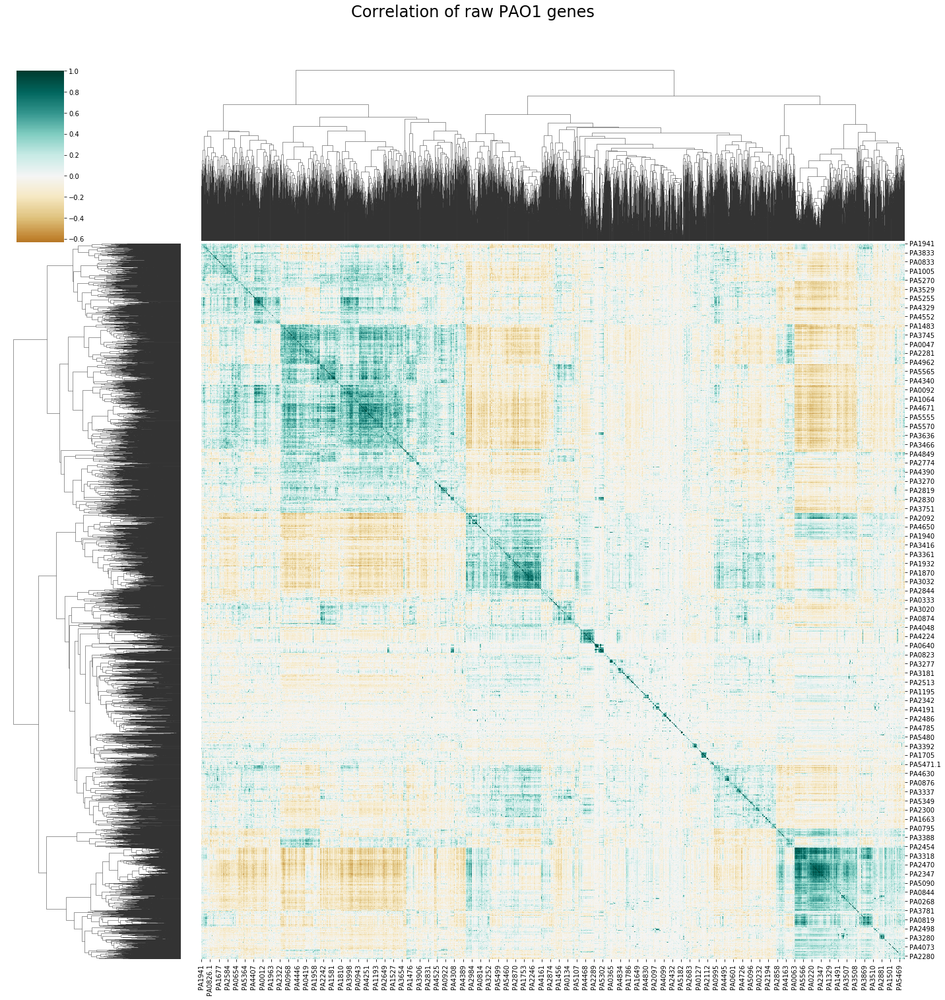

In [17]:
%%time
# Plot heatmap
o1 = sns.clustermap(pao1_corr_original, cmap="BrBG", center=0, figsize=(20, 20))
o1.fig.suptitle("Correlation of raw PAO1 genes", y=1.05, fontsize=24)

# Save
pao1_pearson_filename = os.path.join(
    paths.LOCAL_DATA_DIR, f"pao1_{subset_genes}_raw_clustermap_test.png"
)
o1.savefig(pao1_pearson_filename, dpi=300)

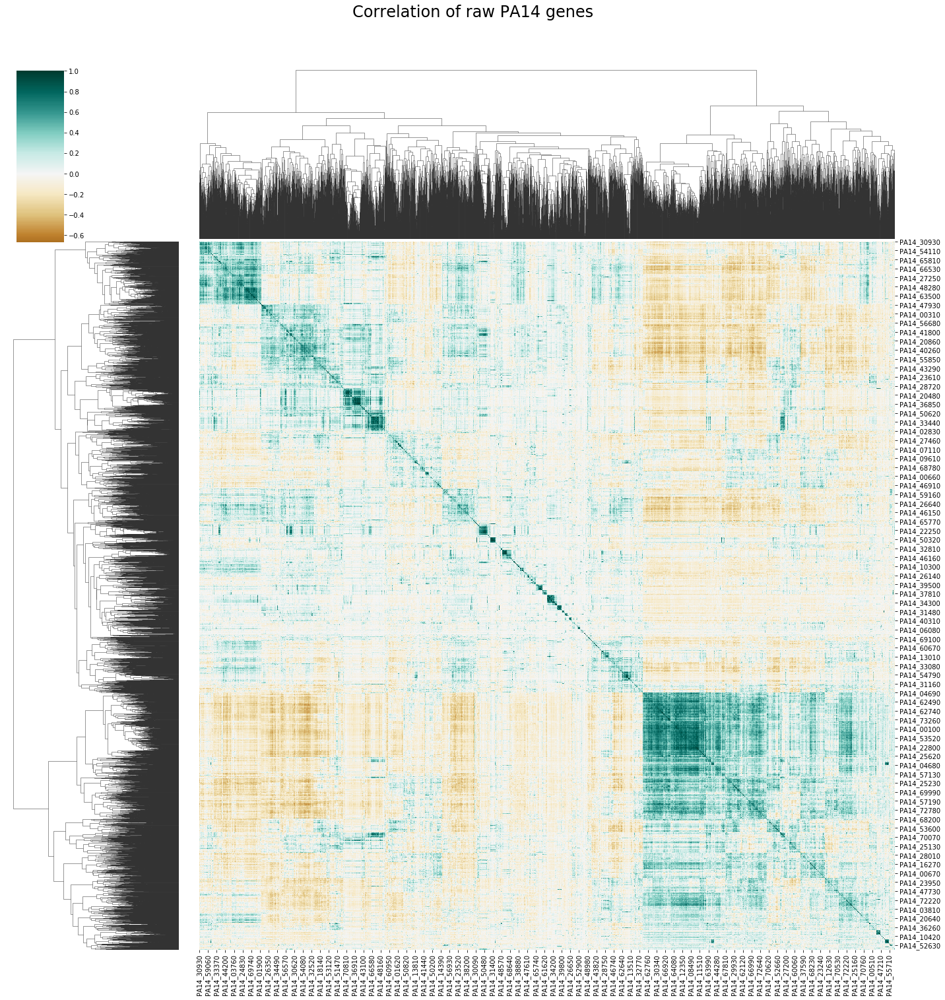

In [18]:
# Plot heatmap
o2 = sns.clustermap(pa14_corr_original, cmap="BrBG", center=0, figsize=(20, 20))
o2.fig.suptitle("Correlation of raw PA14 genes", y=1.05, fontsize=24)

# Save
pa14_pearson_filename = os.path.join(
    paths.LOCAL_DATA_DIR, f"pa14__{subset_genes}_raw_clustermap_test.png"
)
o2.savefig(pa14_pearson_filename, dpi=300)

## Log transform + SPELL Correlation

_Review of SVD_

Singular Value Decomposition is a way to factorize your matrix, $X^{mxn}$ into singular vectors and singular values: $X = U \Sigma V^*$

In our case $X$ is **gene x sample** and then the columns of $U$ (gene x eigensample) are the left singular vectors (gene coefficient vectors); $\Sigma$ (eigengene x eigensample) has singular values and is diagonal (mode amplitudes); and $V^T$ (eigengene x sample) has rows that are the right singular vectors (expression level vectors).

Here we are using SVD to reduce the noise in our original data by performing dimensionality reduction. This dimensionality is done by neglecting the small singular values in the diagonal matrix $\Sigma$. Normally people would get the projection of the original data onto the singular vectors by $U \Sigma$ and apply the correlation on the projected data. Here, we're following the description in [Hibbs et. al.](https://academic.oup.com/bioinformatics/article/23/20/2692/229926) where they performed correlation on $U$ only.

From [Hibbs et. al.](https://academic.oup.com/bioinformatics/article/23/20/2692/229926), we apply their "signal balancing technique that enhances biological information". This is the first part of their [SPELL](https://spell.yeastgenome.org/) algorithm that is described in section 2.3.1. SPELL calculates the correlation on the gene coefficient matrix, $U$ (i.e. how much genes contribute to a latent variable) that is generated after applying SVD. This matrix represents how genes contribute to independent latent variables that capture the signal in the data where the variance of the variables is 1. The idea is that correlations between gene contributions are more balanced so that less prominent patterns are amplified and more dominant patterns are dampended due to this compression. Figure 3 shows how well SPELL recapitulates biology (i.e. the relationship between genes within a GO term) compared to Pearson correlation.

In [19]:
# Transpose compendia to be gene x sample
# Here we're interested in how genes cluster
pao1_compendium_T = pao1_compendium.T
pa14_compendium_T = pa14_compendium.T

In [20]:
# log transform data
pao1_compendium_log10 = np.log10(1 + pao1_compendium_T)
pa14_compendium_log10 = np.log10(1 + pa14_compendium_T)

In [21]:
# Apply SVD
pao1_U, pao1_s, pao1_Vh = np.linalg.svd(pao1_compendium_log10, full_matrices=False)
pa14_U, pa14_s, pa14_Vh = np.linalg.svd(pa14_compendium_log10, full_matrices=False)

#### Quick check

Plot the variance explained to make sure that our choice of number of singular vectors is reasonable and aligns with our manual inspection

Text(0, 0.5, 'Percent variability explained')

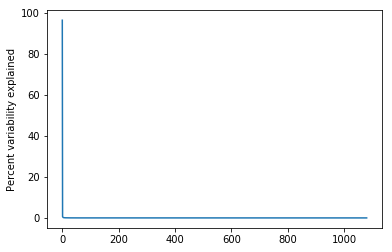

In [22]:
plt.plot(pao1_s ** 2 / sum(pao1_s ** 2) * 100)
plt.ylabel("Percent variability explained")

Text(0, 0.5, 'Percent variability explained')

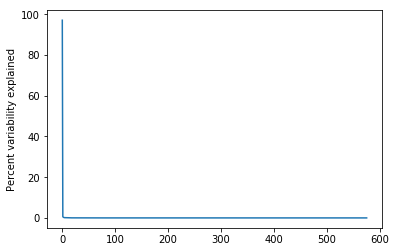

In [23]:
plt.plot(pa14_s ** 2 / sum(pa14_s ** 2) * 100)
plt.ylabel("Percent variability explained")

In [24]:
print(pao1_compendium_T.shape)
print(pao1_U.shape, pao1_s.shape, pao1_Vh.shape)

(5563, 1081)
(5563, 1081) (1081,) (1081, 1081)


In [25]:
print(pa14_compendium_T.shape)
print(pa14_U.shape, pa14_s.shape, pa14_Vh.shape)

(5887, 576)
(5887, 576) (576,) (576, 576)


In [26]:
# Convert ndarray to df to use corr()
pao1_U_df = pd.DataFrame(data=pao1_U, index=pao1_compendium_T.index)
pa14_U_df = pd.DataFrame(data=pa14_U, index=pa14_compendium_T.index)

In [27]:
# Correlation of U
# Since `corr()` computes pairwise correlation of columns we need to invert U
pao1_corr_log_spell = pao1_U_df.iloc[:, :num_SVs].T.corr()
pa14_corr_log_spell = pa14_U_df.iloc[:, :num_SVs].T.corr()

In [28]:
# Check for duplicates indices
assert pao1_corr_log_spell.index.duplicated().sum() == 0
assert pa14_corr_log_spell.index.duplicated().sum() == 0

In [29]:
# Check for duplicate rows
assert pao1_corr_log_spell[pao1_corr_log_spell.duplicated(keep=False)].shape[0] == 0
assert pa14_corr_log_spell[pa14_corr_log_spell.duplicated(keep=False)].shape[0] == 0

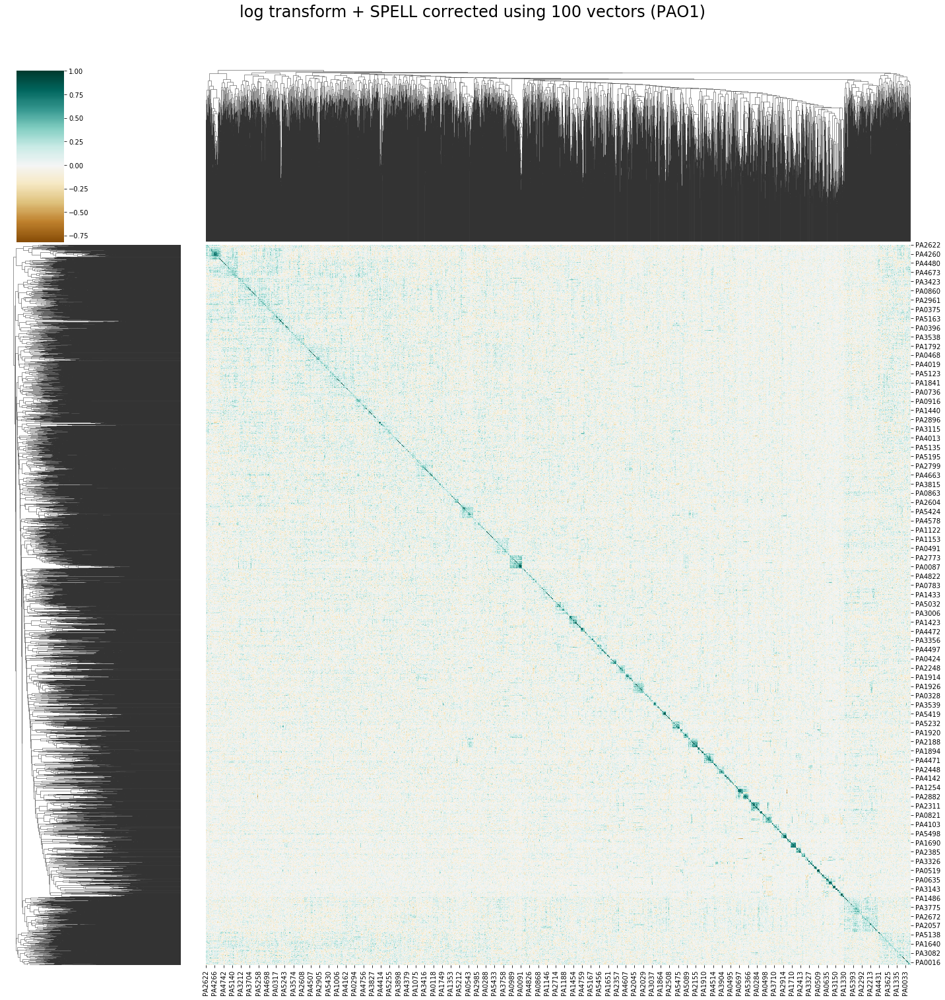

In [30]:
# Plot heatmap
h1a = sns.clustermap(pao1_corr_log_spell, cmap="BrBG", center=0, figsize=(20, 20))
h1a.fig.suptitle(
    f"log transform + SPELL corrected using {num_SVs} vectors (PAO1)",
    y=1.05,
    fontsize=24,
)

# Save
pao1_log_spell_filename = os.path.join(
    paths.LOCAL_DATA_DIR, f"pao1_{subset_genes}_log_spell_clustermap_test.png"
)
h1a.savefig(pao1_log_spell_filename, dpi=300)

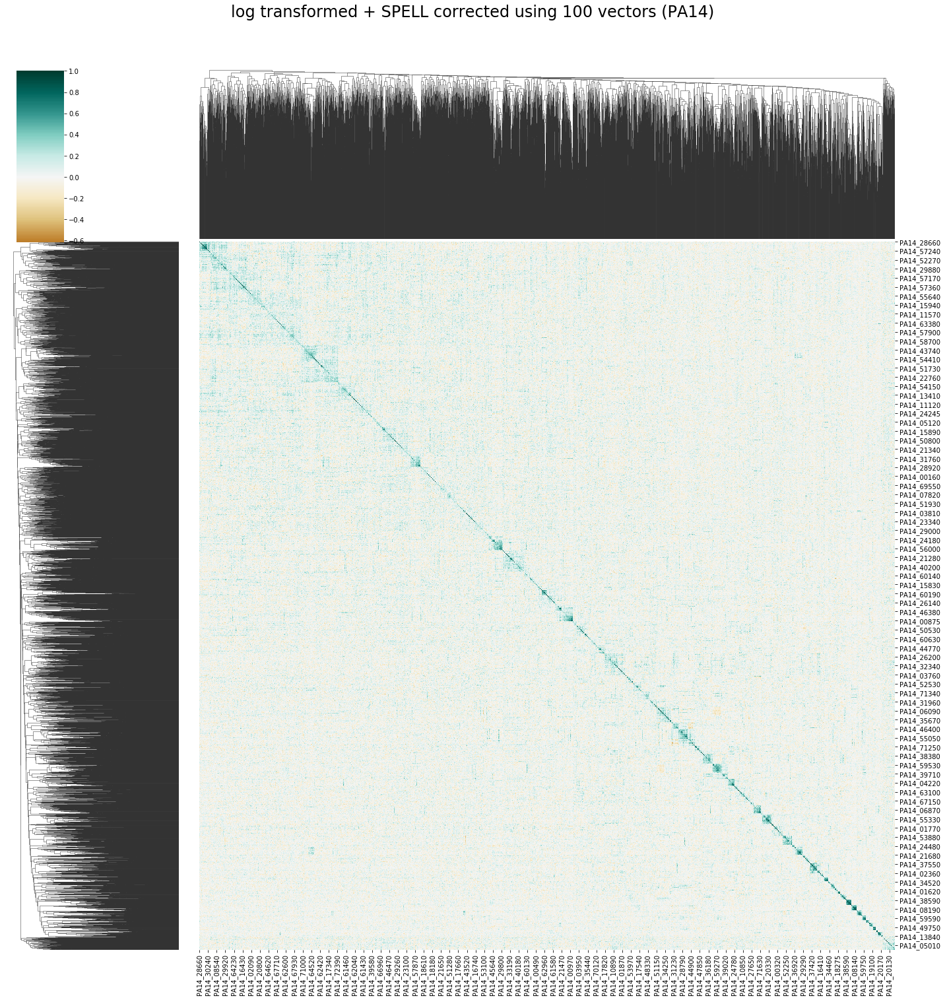

In [31]:
h2a = sns.clustermap(pa14_corr_log_spell, cmap="BrBG", center=0, figsize=(20, 20))
h2a.fig.suptitle(
    f"log transformed + SPELL corrected using {num_SVs} vectors (PA14)",
    y=1.05,
    fontsize=24,
)

# Save
pa14_log_spell_filename = os.path.join(
    paths.LOCAL_DATA_DIR, f"pa14_{subset_genes}_log_spell_clustermap_test.png"
)
h2a.savefig(pa14_log_spell_filename, dpi=300)

In [32]:
# Save raw correlation matrices
pao1_original_mat_filename = os.path.join(
    paths.LOCAL_DATA_DIR, f"pao1_{subset_genes}_raw_mat_test.tsv"
)
pa14_original_mat_filename = os.path.join(
    paths.LOCAL_DATA_DIR, f"pa14_{subset_genes}_raw_mat_test.tsv"
)
pao1_corr_original.to_csv(pao1_original_mat_filename, sep="\t")
pa14_corr_original.to_csv(pa14_original_mat_filename, sep="\t")

In [33]:
# Save log transform + SPELL correlation matrices
pao1_log_spell_mat_filename = os.path.join(
    paths.LOCAL_DATA_DIR, f"pao1_{subset_genes}_log_spell_mat_test.tsv"
)
pa14_log_spell_mat_filename = os.path.join(
    paths.LOCAL_DATA_DIR, f"pa14_{subset_genes}_log_spell_mat_test.tsv"
)
pao1_corr_log_spell.to_csv(pao1_log_spell_mat_filename, sep="\t")
pa14_corr_log_spell.to_csv(pa14_log_spell_mat_filename, sep="\t")